In [1]:
import numpy as np
import matplotlib.pyplot as plt
from MyFunctions import Feta, Fmu
from pylab import clf, plot, xlim, ylim, show, pause, draw
from matplotlib.ticker import MultipleLocator

In [2]:
# plotting mechanics
text = 16
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

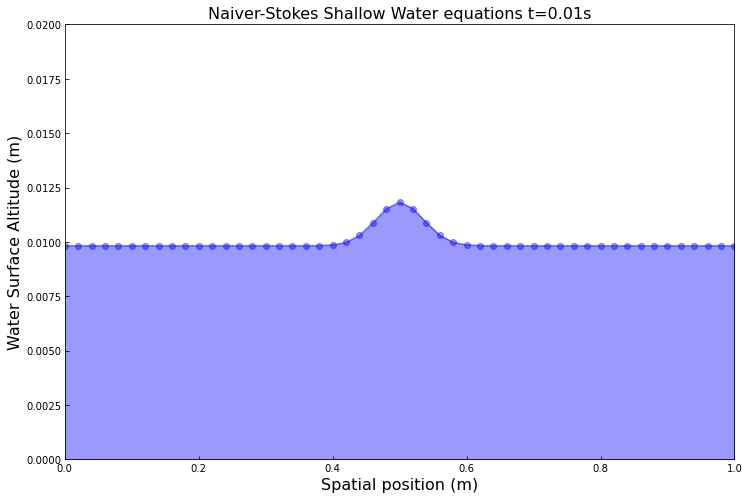

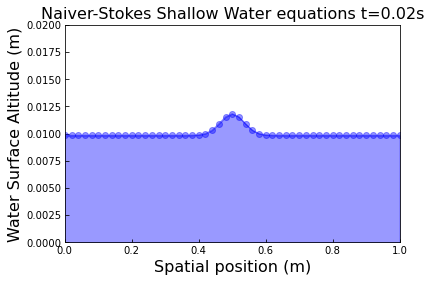

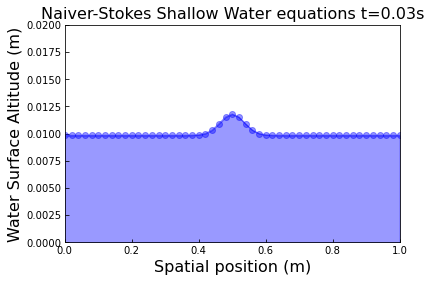

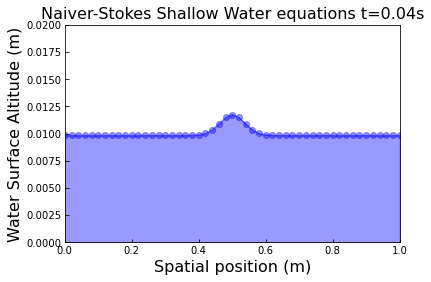

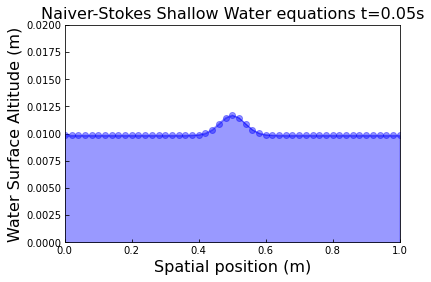

...

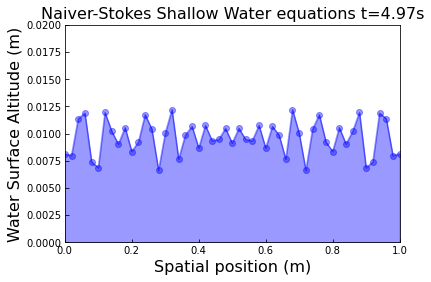

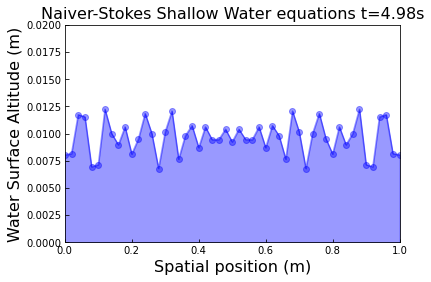

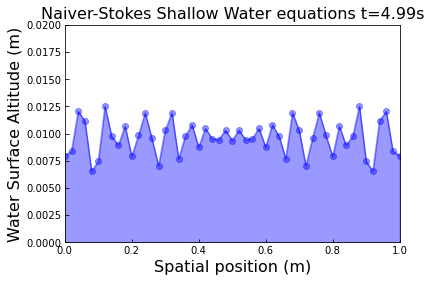

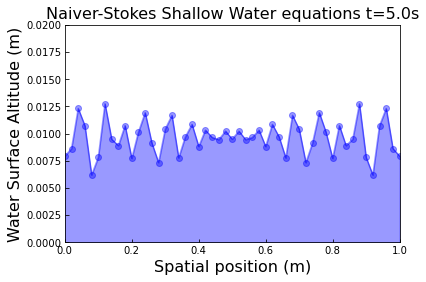

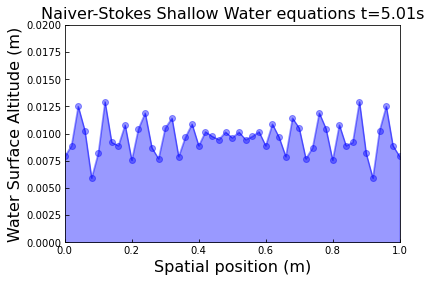

In [3]:
# define boundary
L = 1 # m
J = 50
# spacing
del_x = L/J # m
# temporal spacing 
del_t = 0.01 # s
# constants
g = 9.8 # m/s^2
eta_b = 0
H = 0.01 # m
epsilon = del_t/1000
A = 0.002 # m
mu0 = 0.5 # m
sigma = 0.05 # m

# initialize arrays
mu = np.empty(J+1,float)
mup = np.empty(J+1,float)
eta = np.empty(J+1,float)
etap = np.empty(J+1,float)
# define boundary condtions
mu[0] = 0
mu[J] = 0
mup[0] = 0
mup[J] = 0
# times we wish to display for later, s
t1 = 0
t2 = 1
t3 = 4

# initial conditions
x_domain = np.linspace(0,1,J+1)
mu[1:J] = 0
eta = H + A*np.exp(-(x_domain-mu0)**2/sigma**2) - np.mean(A*np.exp(-(x_domain-mu0)**2/sigma**2))

# define constant 
C = del_t/2/del_x

# define total time of solution
tend = 5
t = 0.0

fig,ax0 = plt.subplots(figsize=(12,8),ncols=1,nrows=1)

ax0.plot(x_domain,eta,marker='o',c='b',alpha=0.6)
ax0.fill_between(x_domain,y1=0,y2=eta,color='blue',alpha=0.4)
ax0.set_title("Shallow Water Simulation t=0s",fontsize=text)
ax0.set_xlabel("Spatial Dimension (m)",fontsize=text)
ax0.set_ylabel("Free Surface Altitude",fontsize=text)
ax0.xaxis.set_minor_locator(MultipleLocator(0.01))
ax0.yaxis.set_ticks_position('both') 
ax0.xaxis.set_ticks_position('both')
ax0.set_xlim([0,1])
ax0.set_ylim([0,0.02])
plt.savefig("Q2_0s.pdf")


# time loop
while t < tend:
    # spatial loop
    for i in range(0,J+1):
        # Treat each boundary individually
        if i == 0:
            # foward difference for lower bound
            mup[i] = mu[i] - C*(Fmu(mu[i+1],eta[i+1]) - Fmu(mu[i],eta[i]))
            etap[i] = eta[i] - C*(Feta(mu[i+1],eta[i+1]) - Feta(mu[i],eta[i]))
        elif i == J:
            # backward difference for upper bound
            mup[i] = mu[i] - C*(Fmu(mu[i],eta[i]) - Fmu(mu[i-1],eta[i-1]))
            etap[i] = eta[i] - C*(Feta(mu[i],eta[i]) - Feta(mu[i-1],eta[i-1]))
        else:
            mup[i] = mu[i] - C*(Fmu(mu[i+1],eta[i+1])-Fmu(mu[i-1],eta[i-1]))
            etap[i] = eta[i] - C*(Feta(mu[i+1],eta[i+1])-Feta(mu[i-1],eta[i-1]))
    mu, mup = mup, mu
    eta, etap = etap, eta
    t += del_t
    clf()
    plt.title(f"Naiver-Stokes Shallow Water equations t={round(t,3)}s",fontsize=text)
    plt.xlabel("Spatial position (m)",fontsize=text)
    plt.ylabel("Water Surface Altitude (m)",fontsize=text)
    plt.plot(x_domain,eta,label=r"$\eta$(x,t)",marker='o',c='blue',alpha=0.4)
    plt.fill_between(x_domain,y1=0,y2=eta,color='blue',alpha=0.4)
    plt.xlim([0,1])
    plt.ylim([0,0.02])
    if abs(t-t2) < epsilon:
         plt.savefig("Q2_1s.pdf")
    if abs(t-t3) < epsilon:
        plt.savefig("Q2_4s.pdf")
    draw()
    pause(0.005)